In [1]:
import pandas as pd
import numpy as np

In [2]:
df = pd.read_csv('dataset.csv')
df

,Unnamed: 0,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,2015825,2508182,HH781001,11/15/2002 12:30:00 PM,003XX N ASHLAND AVE,0810,THEFT,OVER $500,STREET,False,...,27.0,28.0,06,1165667.0,1902638.0,2002,02/28/2018 03:56:25 PM,41.888430,-87.667064,"(41.888429628, -87.667063831)"
1,2110300,2687361,HJ308830,04/18/2003 06:10:00 PM,016XX W 18TH ST,0486,BATTERY,DOMESTIC BATTERY SIMPLE,SIDEWALK,False,...,25.0,31.0,08B,1165650.0,1891466.0,2003,02/10/2018 03:50:01 PM,41.857773,-87.667445,"(41.857773091, -87.667444544)"
2,381828,10755691,HZ518320,11/16/2016 09:50:00 PM,009XX S CICERO AVE,1506,PROSTITUTION,SOLICIT ON PUBLIC WAY,STREET,True,...,24.0,25.0,16,1144531.0,1895566.0,2016,02/10/2018 03:50:01 PM,41.869447,-87.744861,"(41.869447309, -87.744861466)"
3,6048052,8740111,HV415603,08/04/2012 05:15:00 PM,072XX S INGLESIDE AVE,0460,BATTERY,SIMPLE,OTHER,False,...,5.0,69.0,08B,1183801.0,1857416.0,2012,02/04/2016 06:33:39 AM,41.763932,-87.601884,"(41.763931739, -87.601884055)"
4,6873402,11924187,JC549979,12/16/2019 04:45:00 PM,017XX W THOME AVE,1310,CRIMINAL DAMAGE,TO PROPERTY,APARTMENT,False,...,40.0,77.0,14,1163394.0,1941667.0,2019,12/23/2019 03:56:38 PM,41.995575,-87.674309,"(41.995575459, -87.674309158)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,3562445,4714376,HM318809,04/21/2006 12:01:00 AM,022XX S WENTWORTH AVE,1310,CRIMINAL DAMAGE,TO PROPERTY,RESTAURANT,False,...,25.0,34.0,14,1175327.0,1889358.0,2006,02/10/2018 03:50:01 PM,41.851777,-87.631988,"(41.851777151, -87.631987613)"
99996,4621702,6567536,HP637109,10/19/2008 10:05:00 PM,002XX W CERMAK RD,1360,CRIMINAL TRESPASS,TO VEHICLE,ALLEY,True,...,25.0,34.0,26,1175002.0,1889741.0,2008,02/28/2018 03:56:25 PM,41.852835,-87.633169,"(41.852835409, -87.633168974)"
99997,5483697,7815219,HS625058,11/20/2010 04:50:00 PM,0000X N STATE ST,0860,THEFT,RETAIL THEFT,DEPARTMENT STORE,True,...,42.0,32.0,06,1176362.0,1900577.0,2010,02/10/2018 03:50:01 PM,41.882540,-87.627851,"(41.882539542, -87.627850543)"
99998,3616848,4921843,HM536277,08/12/2006 05:29:00 PM,032XX W ROOSEVELT RD,0530,ASSAULT,AGGRAVATED: OTHER DANG WEAPON,ALLEY,True,...,24.0,29.0,04A,1154766.0,1894523.0,2006,02/28/2018 03:56:25 PM,41.866387,-87.707314,"(41.866386519, -87.707313676)"


# 1. Preprocessing

## 1.1 Organising the data
- 

In [5]:
df['Date'] = pd.to_datetime(df['Date'], format = '%m/%d/%Y %I:%M:%S %p')
df['Updated On'] = pd.to_datetime(df['Updated On'], format = '%m/%d/%Y %I:%M:%S %p')

df['Month'] = [d.month for d in df['Date']]

df=df.assign(Season=pd.cut(df['Month'],
                            [1,2,5,8,11,12],
                            labels=['Winter','Spring','Summer','Autumn','winter'],
                            include_lowest=True)) 
df['Season'] = df['Season'].str.lower()
               
df['Day'] = [d.day for d in df['Date']]
df['Time']  = [d.time() for d in df['Date']]

# df['hour']  = [d.hour for d in df['Date']]
# df['minute']  = [d.minute for d in df['Date']]

df['Dayofweek'] = [d.strftime('%a') for d in df['Date']]
# df['Downumber'] =  [int(d.strftime('%w')) for d in df['Date']]

df=df.assign(Session=pd.cut(df.Date.dt.hour,
                            [0,5,11,17,23],
                            labels=['Night','Morning','Afternoon','Evening'],
                            include_lowest=True))

df['Block Type'] = [d.split()[-1] for d in df['Block']]
df['Block Type'] = df['Block Type'].str.lower()
others = []
for ty in df['Block Type'].unique():
    if df.loc[df['Block Type']==ty].shape[0]<100:
        others.append(ty)

dict_replace = dict()
for bt in others:
    dict_replace[bt] = 'others'
df["Block Type"].replace(dict_replace, inplace=True)

In [6]:
df

,Unnamed: 0,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,...,Latitude,Longitude,Location,Month,Season,Day,Time,Dayofweek,Session,Block Type
0,2015825,2508182,HH781001,2002-11-15 12:30:00,003XX N ASHLAND AVE,0810,THEFT,OVER $500,STREET,False,...,41.888430,-87.667064,"(41.888429628, -87.667063831)",11,autumn,15,12:30:00,Fri,Afternoon,ave
1,2110300,2687361,HJ308830,2003-04-18 18:10:00,016XX W 18TH ST,0486,BATTERY,DOMESTIC BATTERY SIMPLE,SIDEWALK,False,...,41.857773,-87.667445,"(41.857773091, -87.667444544)",4,spring,18,18:10:00,Fri,Evening,st
2,381828,10755691,HZ518320,2016-11-16 21:50:00,009XX S CICERO AVE,1506,PROSTITUTION,SOLICIT ON PUBLIC WAY,STREET,True,...,41.869447,-87.744861,"(41.869447309, -87.744861466)",11,autumn,16,21:50:00,Wed,Evening,ave
3,6048052,8740111,HV415603,2012-08-04 17:15:00,072XX S INGLESIDE AVE,0460,BATTERY,SIMPLE,OTHER,False,...,41.763932,-87.601884,"(41.763931739, -87.601884055)",8,summer,4,17:15:00,Sat,Afternoon,ave
4,6873402,11924187,JC549979,2019-12-16 16:45:00,017XX W THOME AVE,1310,CRIMINAL DAMAGE,TO PROPERTY,APARTMENT,False,...,41.995575,-87.674309,"(41.995575459, -87.674309158)",12,winter,16,16:45:00,Mon,Afternoon,ave
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,3562445,4714376,HM318809,2006-04-21 00:01:00,022XX S WENTWORTH AVE,1310,CRIMINAL DAMAGE,TO PROPERTY,RESTAURANT,False,...,41.851777,-87.631988,"(41.851777151, -87.631987613)",4,spring,21,00:01:00,Fri,Night,ave
99996,4621702,6567536,HP637109,2008-10-19 22:05:00,002XX W CERMAK RD,1360,CRIMINAL TRESPASS,TO VEHICLE,ALLEY,True,...,41.852835,-87.633169,"(41.852835409, -87.633168974)",10,autumn,19,22:05:00,Sun,Evening,rd
99997,5483697,7815219,HS625058,2010-11-20 16:50:00,0000X N STATE ST,0860,THEFT,RETAIL THEFT,DEPARTMENT STORE,True,...,41.882540,-87.627851,"(41.882539542, -87.627850543)",11,autumn,20,16:50:00,Sat,Afternoon,st
99998,3616848,4921843,HM536277,2006-08-12 17:29:00,032XX W ROOSEVELT RD,0530,ASSAULT,AGGRAVATED: OTHER DANG WEAPON,ALLEY,True,...,41.866387,-87.707314,"(41.866386519, -87.707313676)",8,summer,12,17:29:00,Sat,Afternoon,rd


Dropping redundant columns

In [7]:
df_targets = df[['IUCR', 'Primary Type', 'Description', 'FBI Code']]
df = df.drop(columns=['Unnamed: 0', 'ID', 'Case Number', 'Block', 'Date', 'Location','Updated On', 'IUCR', 'Primary Type', 'Description', 'FBI Code', 'Latitude', 'Longitude', 'Time', 'Month'])

In [8]:
df['Arrest'] = df['Arrest'].astype('int64')
df['Domestic'] = df['Domestic'].astype('int64')

In [9]:
df

,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,X Coordinate,Y Coordinate,Year,Season,Day,Dayofweek,Session,Block Type
0,STREET,0,0,1333,12.0,27.0,28.0,1165667.0,1902638.0,2002,autumn,15,Fri,Afternoon,ave
1,SIDEWALK,0,1,1222,12.0,25.0,31.0,1165650.0,1891466.0,2003,spring,18,Fri,Evening,st
2,STREET,1,0,1131,11.0,24.0,25.0,1144531.0,1895566.0,2016,autumn,16,Wed,Evening,ave
3,OTHER,0,0,324,3.0,5.0,69.0,1183801.0,1857416.0,2012,summer,4,Sat,Afternoon,ave
4,APARTMENT,0,0,2433,24.0,40.0,77.0,1163394.0,1941667.0,2019,winter,16,Mon,Afternoon,ave
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,RESTAURANT,0,0,2111,9.0,25.0,34.0,1175327.0,1889358.0,2006,spring,21,Fri,Night,ave
99996,ALLEY,1,0,2111,9.0,25.0,34.0,1175002.0,1889741.0,2008,autumn,19,Sun,Evening,rd
99997,DEPARTMENT STORE,1,0,122,1.0,42.0,32.0,1176362.0,1900577.0,2010,autumn,20,Sat,Afternoon,st
99998,ALLEY,1,0,1022,10.0,24.0,29.0,1154766.0,1894523.0,2006,summer,12,Sat,Afternoon,rd


### Class labels used for NMI

In [10]:
df_targets

,IUCR,Primary Type,Description,FBI Code
0,0810,THEFT,OVER $500,06
1,0486,BATTERY,DOMESTIC BATTERY SIMPLE,08B
2,1506,PROSTITUTION,SOLICIT ON PUBLIC WAY,16
3,0460,BATTERY,SIMPLE,08B
4,1310,CRIMINAL DAMAGE,TO PROPERTY,14
...,...,...,...,...
99995,1310,CRIMINAL DAMAGE,TO PROPERTY,14
99996,1360,CRIMINAL TRESPASS,TO VEHICLE,26
99997,0860,THEFT,RETAIL THEFT,06
99998,0530,ASSAULT,AGGRAVATED: OTHER DANG WEAPON,04A


Number of unique values in each feature

In [174]:
for column in df.columns:
    print(column, df[column].unique().shape[0])

Location Description 149
Arrest 2
Domestic 2
Beat 302
District 23
Ward 50
Community Area 77
X Coordinate 38908
Y Coordinate 49371
Year 21
Season 4
Day 31
Dayofweek 7
Session 4
Block Type 11


# 2. Feature Selection

In [12]:
corr = df.corr(method='pearson')
corr

,Arrest,Domestic,Beat,District,Ward,Community Area,X Coordinate,Y Coordinate,Year,Day
Arrest,1.000000,-0.067997,-0.015838,-0.016449,-0.014598,-0.008251,-0.032989,0.003528,-0.076169,0.003347
Domestic,-0.067997,1.000000,-0.046332,-0.043010,-0.052999,0.074204,0.007813,-0.081511,0.056347,0.000149
Beat,-0.015838,-0.046332,1.000000,0.948853,0.644519,-0.504365,-0.509408,0.639964,-0.032027,-0.001635
District,-0.016449,-0.043010,0.948853,1.000000,0.690009,-0.498477,-0.558346,0.647472,-0.000614,-0.001993
Ward,-0.014598,-0.052999,0.644519,0.690009,1.000000,-0.530823,-0.461449,0.653379,0.022814,-0.002706
Community Area,-0.008251,0.074204,-0.504365,-0.498477,-0.530823,1.000000,0.261823,-0.777884,-0.008602,0.003546
X Coordinate,-0.032989,0.007813,-0.509408,-0.558346,-0.461449,0.261823,1.000000,-0.556600,0.000111,0.003928
Y Coordinate,0.003528,-0.081511,0.639964,0.647472,0.653379,-0.777884,-0.556600,1.000000,0.005028,-0.005234
Year,-0.076169,0.056347,-0.032027,-0.000614,0.022814,-0.008602,0.000111,0.005028,1.000000,-0.007261
Day,0.003347,0.000149,-0.001635,-0.001993,-0.002706,0.003546,0.003928,-0.005234,-0.007261,1.000000


In [13]:
df_numvar = df[corr.columns]

Removing columns based on correlation with each of the other remaining columns.
A column is removed if it has more than 0.9 correlation with any of the other column in the dataframe.

In [14]:
dropcol = []

for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if corr.iloc[i,j] >= 0.9:
            print(df_numvar.columns[i],df_numvar.columns[j])
            print(df_numvar.columns[i], df_numvar[df_numvar.columns[i]].unique().shape)
            print(df_numvar.columns[j], df_numvar[df_numvar.columns[j]].unique().shape)

            if df_numvar[df_numvar.columns[i]].unique().shape[0] > df_numvar[df_numvar.columns[j]].unique().shape[0]:
                dropcol.append(df_numvar.columns[i])
            else:
                dropcol.append(df_numvar.columns[j])

dropcol = set(dropcol)
df1 = df.drop(columns = dropcol)

Beat District
Beat (302,)
District (23,)


In [15]:
dropcol = []

for i in range(corr.shape[0]):
    for j in range(i+1, corr.shape[0]):
        if corr.iloc[i,j] >= 0.9:
            print(df_numvar.columns[i],df_numvar.columns[j])
            print(df_numvar.columns[i], df_numvar[df_numvar.columns[i]].unique().shape)
            print(df_numvar.columns[j], df_numvar[df_numvar.columns[j]].unique().shape)

            if df_numvar[df_numvar.columns[i]].unique().shape[0] < df_numvar[df_numvar.columns[j]].unique().shape[0]:
                dropcol.append(df_numvar.columns[i])
            else:
                dropcol.append(df_numvar.columns[j])

dropcol = set(dropcol)
df2 = df.drop(columns = dropcol)

Beat District
Beat (302,)
District (23,)


In [16]:
df1

,Location Description,Arrest,Domestic,District,Ward,Community Area,X Coordinate,Y Coordinate,Year,Season,Day,Dayofweek,Session,Block Type
0,STREET,0,0,12.0,27.0,28.0,1165667.0,1902638.0,2002,autumn,15,Fri,Afternoon,ave
1,SIDEWALK,0,1,12.0,25.0,31.0,1165650.0,1891466.0,2003,spring,18,Fri,Evening,st
2,STREET,1,0,11.0,24.0,25.0,1144531.0,1895566.0,2016,autumn,16,Wed,Evening,ave
3,OTHER,0,0,3.0,5.0,69.0,1183801.0,1857416.0,2012,summer,4,Sat,Afternoon,ave
4,APARTMENT,0,0,24.0,40.0,77.0,1163394.0,1941667.0,2019,winter,16,Mon,Afternoon,ave
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,RESTAURANT,0,0,9.0,25.0,34.0,1175327.0,1889358.0,2006,spring,21,Fri,Night,ave
99996,ALLEY,1,0,9.0,25.0,34.0,1175002.0,1889741.0,2008,autumn,19,Sun,Evening,rd
99997,DEPARTMENT STORE,1,0,1.0,42.0,32.0,1176362.0,1900577.0,2010,autumn,20,Sat,Afternoon,st
99998,ALLEY,1,0,10.0,24.0,29.0,1154766.0,1894523.0,2006,summer,12,Sat,Afternoon,rd


In [17]:
df2

,Location Description,Arrest,Domestic,Beat,Ward,Community Area,X Coordinate,Y Coordinate,Year,Season,Day,Dayofweek,Session,Block Type
0,STREET,0,0,1333,27.0,28.0,1165667.0,1902638.0,2002,autumn,15,Fri,Afternoon,ave
1,SIDEWALK,0,1,1222,25.0,31.0,1165650.0,1891466.0,2003,spring,18,Fri,Evening,st
2,STREET,1,0,1131,24.0,25.0,1144531.0,1895566.0,2016,autumn,16,Wed,Evening,ave
3,OTHER,0,0,324,5.0,69.0,1183801.0,1857416.0,2012,summer,4,Sat,Afternoon,ave
4,APARTMENT,0,0,2433,40.0,77.0,1163394.0,1941667.0,2019,winter,16,Mon,Afternoon,ave
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,RESTAURANT,0,0,2111,25.0,34.0,1175327.0,1889358.0,2006,spring,21,Fri,Night,ave
99996,ALLEY,1,0,2111,25.0,34.0,1175002.0,1889741.0,2008,autumn,19,Sun,Evening,rd
99997,DEPARTMENT STORE,1,0,122,42.0,32.0,1176362.0,1900577.0,2010,autumn,20,Sat,Afternoon,st
99998,ALLEY,1,0,1022,24.0,29.0,1154766.0,1894523.0,2006,summer,12,Sat,Afternoon,rd


# 3. Encoding

In [44]:
to_cat = ['Location Description', 'Beat', 'Ward', 'Community Area', 'Season', 'Day', 'Dayofweek', 'Session','Block Type']

for column in to_cat:
    df2[column] = df2[column].astype('category')

In [46]:
df2.dtypes

Location Description    category
Arrest                     int64
Domestic                   int64
Beat                    category
Ward                    category
Community Area          category
X Coordinate             float64
Y Coordinate             float64
Year                       int64
Season                  category
Day                     category
Dayofweek               category
Session                 category
Block Type              category
dtype: object

One Hot Encoding

In [87]:
df1_onehot = pd.get_dummies(df1)

In [47]:
df_onehot = pd.get_dummies(df2)

In [50]:
df_onehot

,Arrest,Domestic,X Coordinate,Y Coordinate,Year,Location Description_ABANDONED BUILDING,Location Description_AIRCRAFT,Location Description_AIRPORT BUILDING NON-TERMINAL - NON-SECURE AREA,Location Description_AIRPORT BUILDING NON-TERMINAL - SECURE AREA,Location Description_AIRPORT EXTERIOR - NON-SECURE AREA,...,Block Type_blvd,Block Type_broadway,Block Type_ct,Block Type_dr,Block Type_others,Block Type_pkwy,Block Type_pl,Block Type_rd,Block Type_st,Block Type_ter
0,0,0,1165667.0,1902638.0,2002,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,1,1165650.0,1891466.0,2003,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2,1,0,1144531.0,1895566.0,2016,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,1183801.0,1857416.0,2012,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,1163394.0,1941667.0,2019,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0,0,1175327.0,1889358.0,2006,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
99996,1,0,1175002.0,1889741.0,2008,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
99997,1,0,1176362.0,1900577.0,2010,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
99998,1,0,1154766.0,1894523.0,2006,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


Label Encoding

In [98]:
from sklearn.preprocessing import LabelEncoder
columns = df1.columns
le = LabelEncoder()
df_label = df1.copy()
df_label[columns] = df_label[columns].apply(le.fit_transform)

In [99]:
df_label

,Location Description,Arrest,Domestic,District,Ward,Community Area,X Coordinate,Y Coordinate,Year,Season,Day,Dayofweek,Session,Block Type
0,131,0,0,11,26,27,21009,31645,1,0,14,0,0,0
1,127,0,1,11,24,30,20994,26324,2,1,17,0,1,9
2,131,1,0,10,23,24,6478,27879,15,0,15,6,1,0
3,94,0,0,2,4,68,33963,12421,11,2,3,2,0,0
4,17,0,0,20,39,76,19222,47669,18,3,15,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,115,0,0,8,24,33,28445,25474,5,1,20,0,3,0
99996,15,1,0,8,24,33,28197,25635,7,0,18,3,1,8
99997,60,1,0,0,41,31,29184,30577,9,0,19,2,0,9
99998,15,1,0,9,23,28,13104,27507,5,2,11,2,0,8


### 3.1 Categorical segmentation based on X and Y Coordinate

In [34]:
df_kmode = df1.copy()
X_space = np.linspace(df_kmode['X Coordinate'].min(), df_kmode['X Coordinate'].max(), 11)
Y_space = np.linspace(df_kmode['Y Coordinate'].min(), df_kmode['Y Coordinate'].max(), 11)
np.linspace(0,100,11)

df_kmode['X Coordinate'].min(), df_kmode['X Coordinate'].max()

df_kmode=df_kmode.assign(X_reg=pd.cut(df_kmode['X Coordinate'],
                            X_space,
                            labels=[1,2,3,4,5,6,7,8,9,10],
                            include_lowest=True))

df_kmode=df_kmode.assign(Y_reg=pd.cut(df_kmode['Y Coordinate'],
                            Y_space,
                            labels=[1,2,3,4,5,6,7,8,9,10],
                            include_lowest=True))
X = (df_kmode['X_reg'].to_numpy()-1)*10
Y = df_kmode['Y_reg'].to_numpy()

df_kmode['zone'] = X+Y

In [35]:
df_kmode = df_kmode.drop(columns = ['X Coordinate', 'Y Coordinate', 'X_reg', 'Y_reg'])
df_kmode

,Location Description,Arrest,Domestic,District,Ward,Community Area,Year,Season,Day,Dayofweek,Session,Block Type,zone
0,STREET,0,0,12.0,27.0,28.0,2002,autumn,15,Fri,Afternoon,ave,67
1,SIDEWALK,0,1,12.0,25.0,31.0,2003,spring,18,Fri,Evening,st,66
2,STREET,1,0,11.0,24.0,25.0,2016,autumn,16,Wed,Evening,ave,46
3,OTHER,0,0,3.0,5.0,69.0,2012,summer,4,Sat,Afternoon,ave,84
4,APARTMENT,0,0,24.0,40.0,77.0,2019,winter,16,Mon,Afternoon,ave,70
...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,RESTAURANT,0,0,9.0,25.0,34.0,2006,spring,21,Fri,Night,ave,76
99996,ALLEY,1,0,9.0,25.0,34.0,2008,autumn,19,Sun,Evening,rd,76
99997,DEPARTMENT STORE,1,0,1.0,42.0,32.0,2010,autumn,20,Sat,Afternoon,st,77
99998,ALLEY,1,0,10.0,24.0,29.0,2006,summer,12,Sat,Afternoon,rd,56


In [36]:
df_kmode = df_kmode.astype('category')

In [37]:
df_kmode.dtypes

Location Description    category
Arrest                  category
Domestic                category
District                category
Ward                    category
Community Area          category
Year                    category
Season                  category
Day                     category
Dayofweek               category
Session                 category
Block Type              category
zone                    category
dtype: object

# 4. Feature Extraction

### 4.1 Feature Extraction of One Hot Encoded data

In [179]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
data_rescaled = scaler.fit_transform(df_onehot)

from sklearn.decomposition import PCA

pca = PCA(n_components = 0.95)
pca.fit(data_rescaled)
reduced = pca.transform(data_rescaled)

### 4.2 Feature Extraction on Label Encoded Data 

In [180]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_label_rescaled = scaler.fit_transform(df_label)

from sklearn.decomposition import PCA

pca = PCA(n_components = 0.95)
pca.fit(df_label_rescaled)
df_label_reduced = pca.transform(df_label_rescaled)

# 5. Clustering

## 5.1 Kmeans

### For Dataframe with Beat

In [54]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from tqdm import tqdm

100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [18:13<00:00, 36.45s/it]


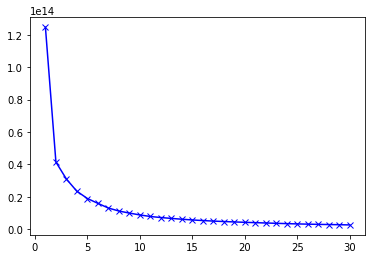

In [55]:
Sum_of_squared_distances = []
K = range(1,31)
for num_clusters in tqdm(K) :
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(df_onehot)
    Sum_of_squared_distances.append(kmeans.inertia_)
plt.plot(K,Sum_of_squared_distances,'bx-')

In [ ]:
# largest curvature at k =2

In [56]:
np.save('kmeans_sqaured_distance', Sum_of_squared_distances)

In [175]:
kmeans2 = KMeans(2)
kmeans2.fit(df_onehot)
kmeans_clusters2_df_onehot = kmeans2.fit_predict(df_onehot)
kmeans_clusters2_df_onehot

array([0, 0, 0, ..., 0, 0, 0])

In [181]:
from sklearn import metrics
metrics.normalized_mutual_info_score(df_targets['Primary Type'], kmeans_clusters2_df_onehot)

0.0057844764251528645

In [183]:
kmeans8 = KMeans(8)
kmeans8.fit(df_onehot)
kmeans_clusters8_df_onehot = kmeans8.fit_predict(df_onehot)
kmeans_clusters8_df_onehot

array([2, 2, 3, ..., 2, 3, 3])

In [184]:
from sklearn import metrics
metrics.normalized_mutual_info_score(df_targets['Primary Type'], kmeans_clusters8_df_onehot)

0.021553052369987807

### Now on data with reduced dimentions

In [76]:
kmeans8 = KMeans(8)
kmeans8.fit(reduced)
kmeans_clusters8_reduced = kmeans8.fit_predict(reduced)
kmeans_clusters8_reduced

array([4, 0, 3, ..., 6, 6, 1])

### Dataframe with District

100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [06:01<00:00, 12.06s/it]


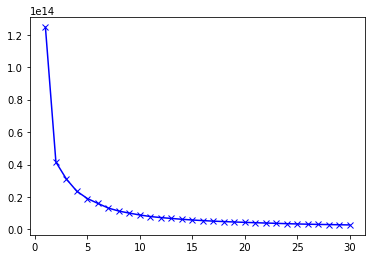

In [88]:
Sum_of_squared_distances_df1_onehot = []
K = range(1,31)
for num_clusters in tqdm(K) :
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(df1_onehot)
    Sum_of_squared_distances_df1_onehot.append(kmeans.inertia_)
plt.plot(K,Sum_of_squared_distances_df1_onehot,'bx-')

In [89]:
np.save('kmeans_sqaured_distance_df1_onehot', Sum_of_squared_distances_df1_onehot)

In [185]:
kmeans2 = KMeans(2)
kmeans2.fit(df1_onehot)
kmeans_clusters2_df1_onehot = kmeans2.fit_predict(df1_onehot)
kmeans_clusters2_df1_onehot

array([1, 1, 1, ..., 1, 1, 1])

In [186]:
from sklearn import metrics
metrics.normalized_mutual_info_score(df_targets['Primary Type'], kmeans_clusters2_df1_onehot)

0.005784476425152868

In [187]:
kmeans8 = KMeans(8)
kmeans8.fit(df1_onehot)
kmeans_clusters8_df1_onehot = kmeans4.fit_predict(df1_onehot)
kmeans_clusters8_df1_onehot

array([5, 5, 0, ..., 5, 0, 0])

In [188]:
from sklearn import metrics
metrics.normalized_mutual_info_score(df_targets['Primary Type'], kmeans_clusters8_df1_onehot)

0.021553727548003034

We can see that both the above dataframes give similar results. (As Beat and District are highly correlated)

### On Label Encoded Data

100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [02:36<00:00,  5.22s/it]


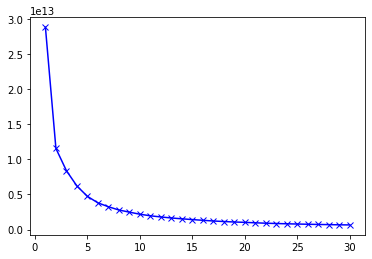

In [165]:
Sum_of_squared_distances_df_label = []
K = range(1,31)
for num_clusters in tqdm(K) :
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(df_label)
    Sum_of_squared_distances_df_label.append(kmeans.inertia_)
plt.plot(K,Sum_of_squared_distances_df_label,'bx-')

In [189]:
kmeans2 = KMeans(2)
kmeans2.fit(df_label)
kmeans_clusters2_df_label = kmeans2.fit_predict(df_label)
kmeans_clusters2_df_label

array([1, 1, 1, ..., 1, 1, 1])

In [190]:
from sklearn import metrics
metrics.normalized_mutual_info_score(df_targets['Primary Type'], kmeans_clusters2_df_label)

0.0052612626192115215

In [100]:
kmeans8 = KMeans(8)
kmeans8.fit(df_label)
kmeans_clusters8_df_label = kmeans8.fit_predict(df_label)
kmeans_clusters8_df_label

array([4, 4, 7, ..., 4, 7, 7])

In [163]:
from sklearn import metrics
metrics.normalized_mutual_info_score(df_targets['Primary Type'], kmeans_clusters8_df_label)

0.02140961010116873

Label encoded data runs faster on the algorithm but is performing bad here.\
But we can improve this by scaling.

100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [01:44<00:00,  3.47s/it]


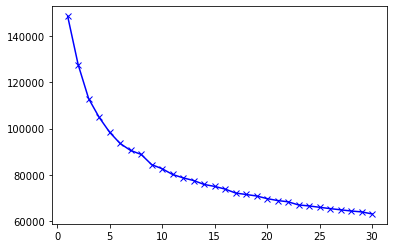

In [167]:
Sum_of_squared_distances_df_label_rescaled = []
K = range(1,31)
for num_clusters in tqdm(K) :
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(df_label_rescaled)
    Sum_of_squared_distances_df_label_rescaled.append(kmeans.inertia_)
plt.plot(K,Sum_of_squared_distances_df_label_rescaled,'bx-')

In [ ]:
# high curvature a around k =7,8,9

In [191]:
kmeans7 = KMeans(7)
kmeans7.fit(df_label_rescaled)
kmeans_clusters7_df_label = kmeans7.fit_predict(df_label_rescaled)
kmeans_clusters7_df_label

array([0, 5, 4, ..., 3, 4, 0])

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


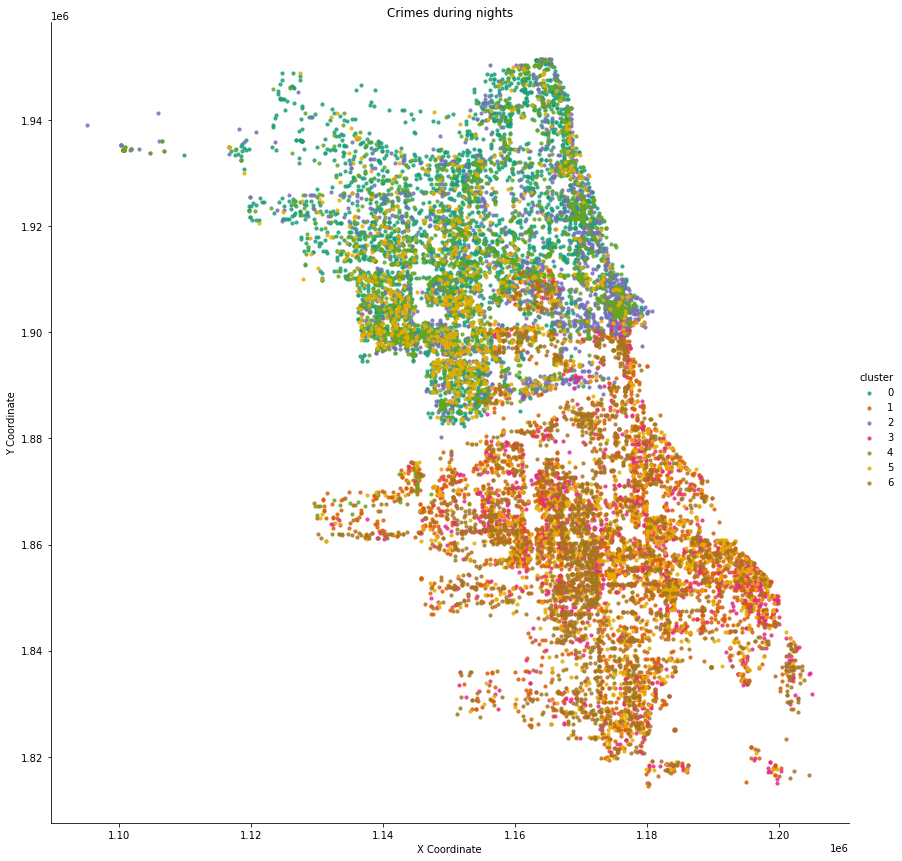

In [256]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(kmeans_clusters7_df_label, columns = ['cluster'])], axis = 1)
new_crimes_data = new_crimes_data.loc[new_crimes_data['Session'] == 'Night']
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Crimes during nights")
plt.show()

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


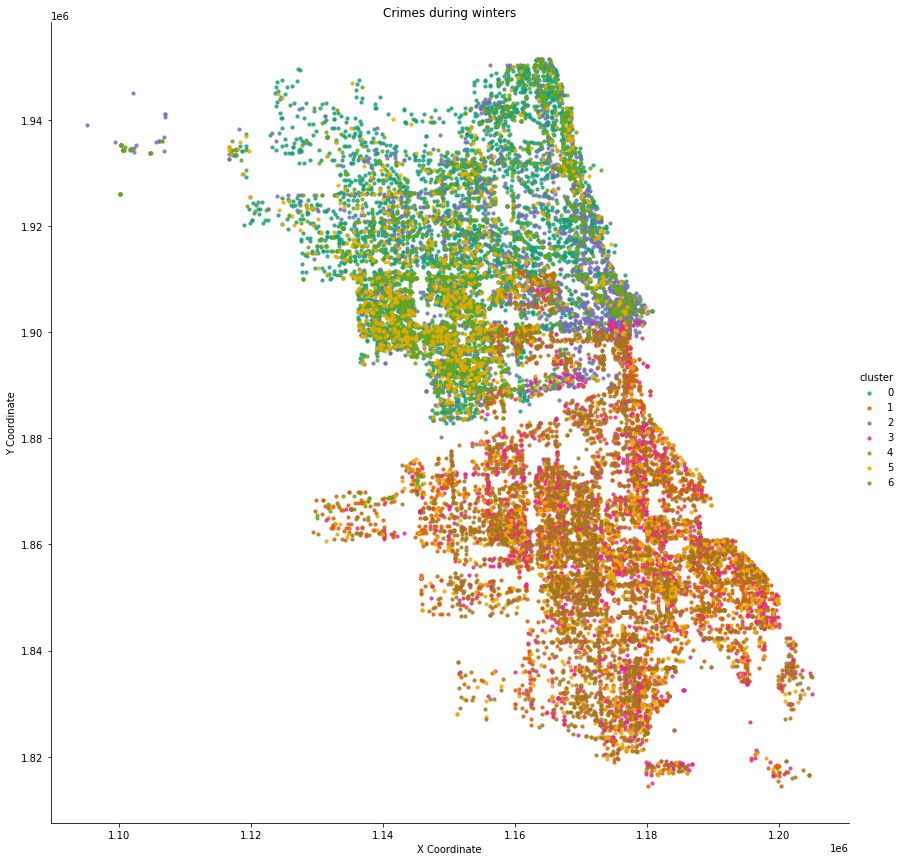

In [257]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(kmeans_clusters7_df_label, columns = ['cluster'])], axis = 1)
new_crimes_data = new_crimes_data.loc[new_crimes_data['Season'] == 'winter']
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Crimes during winters")
plt.show()

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


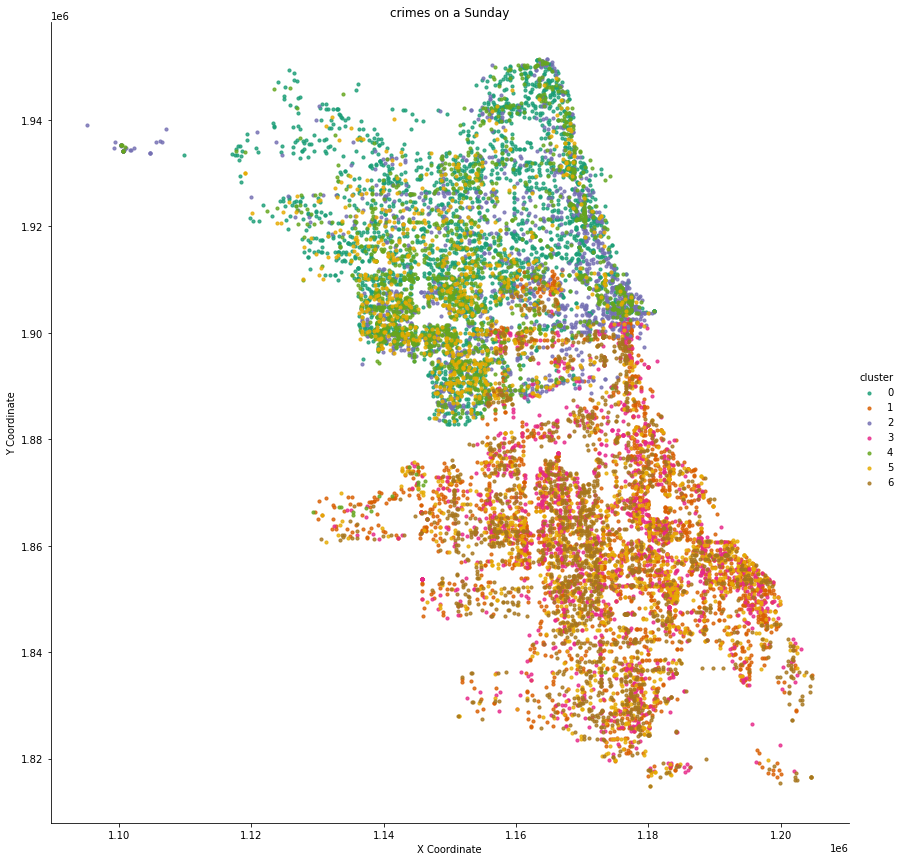

In [258]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(kmeans_clusters7_df_label, columns = ['cluster'])], axis = 1)
new_crimes_data = new_crimes_data.loc[new_crimes_data['Dayofweek'] == 'Sun']
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("crimes on a Sunday")
plt.show()

In [192]:
from sklearn import metrics
metrics.normalized_mutual_info_score(df_targets['Primary Type'], kmeans_clusters7_df_label)

0.14300472060304784

In [193]:
kmeans8 = KMeans(8)
kmeans8.fit(df_label_rescaled)
kmeans_clusters8_df_label = kmeans8.fit_predict(df_label_rescaled)
kmeans_clusters8_df_label

array([7, 1, 6, ..., 3, 6, 7])

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


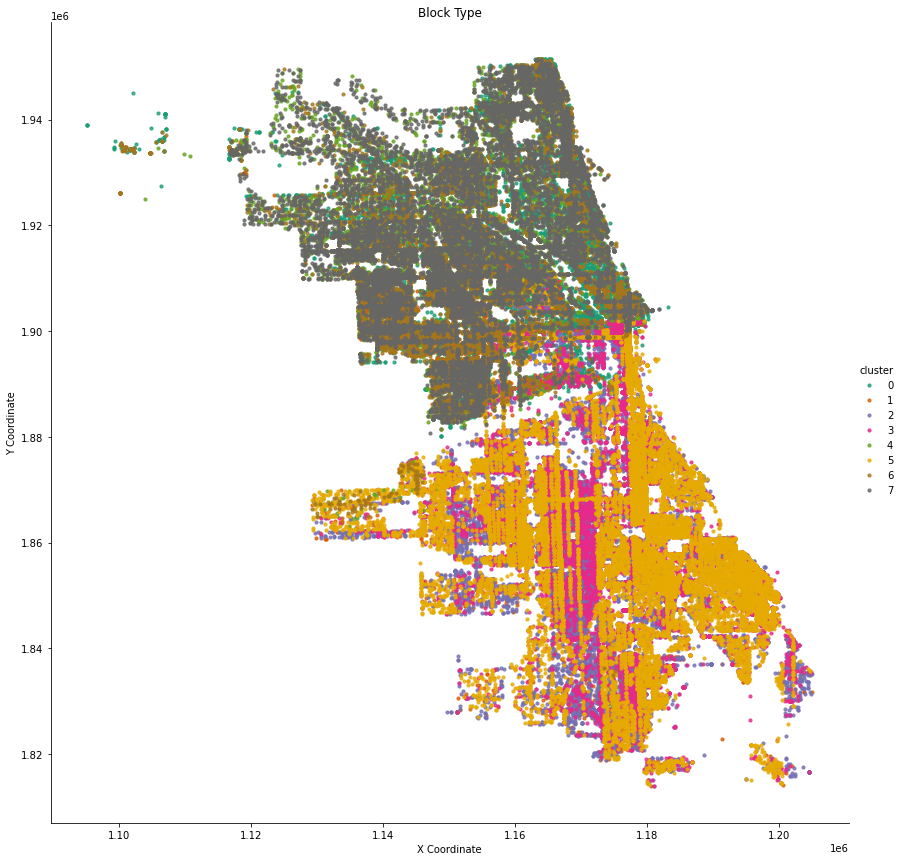

In [222]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(kmeans_clusters8_df_label, columns = ['cluster'])], axis = 1)
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Block Type")
plt.show()

In [194]:
from sklearn import metrics
metrics.normalized_mutual_info_score(df_targets['Primary Type'], kmeans_clusters8_df_label)

0.13964156136509936

In [195]:
kmeans9 = KMeans(9)
kmeans9.fit(df_label_rescaled)
kmeans_clusters9_df_label = kmeans9.fit_predict(df_label_rescaled)
kmeans_clusters9_df_label

array([4, 5, 7, ..., 0, 0, 3])

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


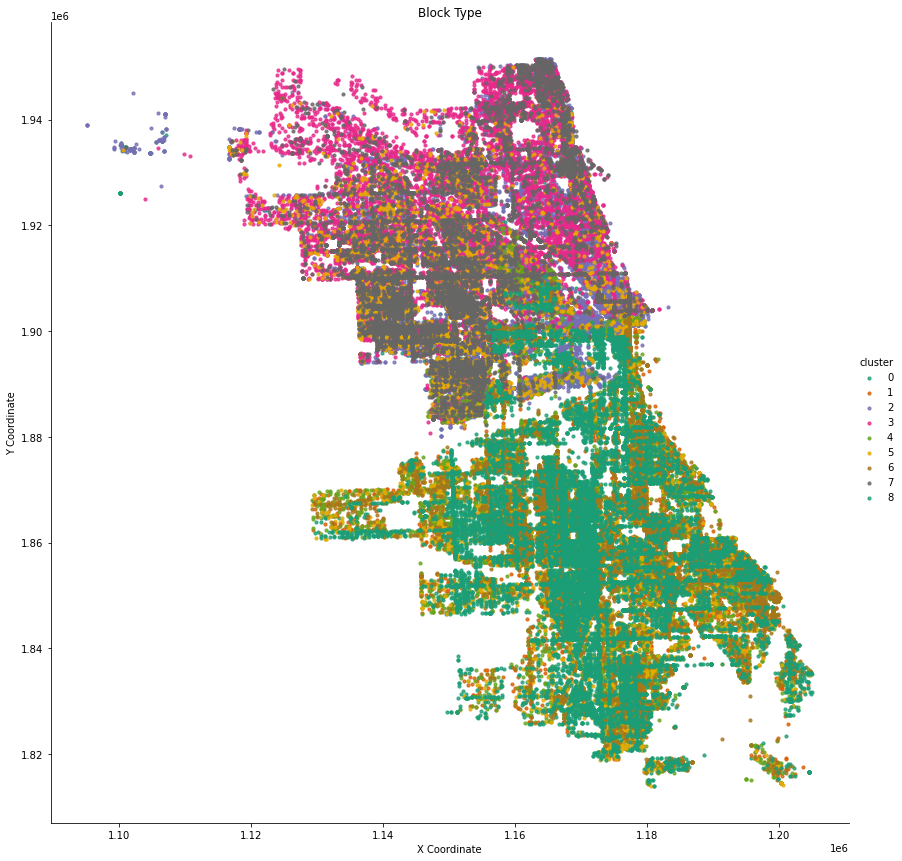

In [223]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(kmeans_clusters9_df_label, columns = ['cluster'])], axis = 1)
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Block Type")
plt.show()

In [196]:
from sklearn import metrics
metrics.normalized_mutual_info_score(df_targets['Primary Type'], kmeans_clusters9_df_label)

0.13294365985250886

### Using dimentionality reduction on labelled data

In [199]:
kmeans7 = KMeans(7)
kmeans7.fit(df_label_reduced)
kmeans_clusters7_label_pca = kmeans7.fit_predict(df_label_reduced)
kmeans_clusters7_label_pca

array([3, 4, 0, ..., 6, 0, 2])

In [200]:
from sklearn import metrics
metrics.normalized_mutual_info_score(df_targets['Primary Type'], kmeans_clusters7_label_pca)

0.14443999448900427

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


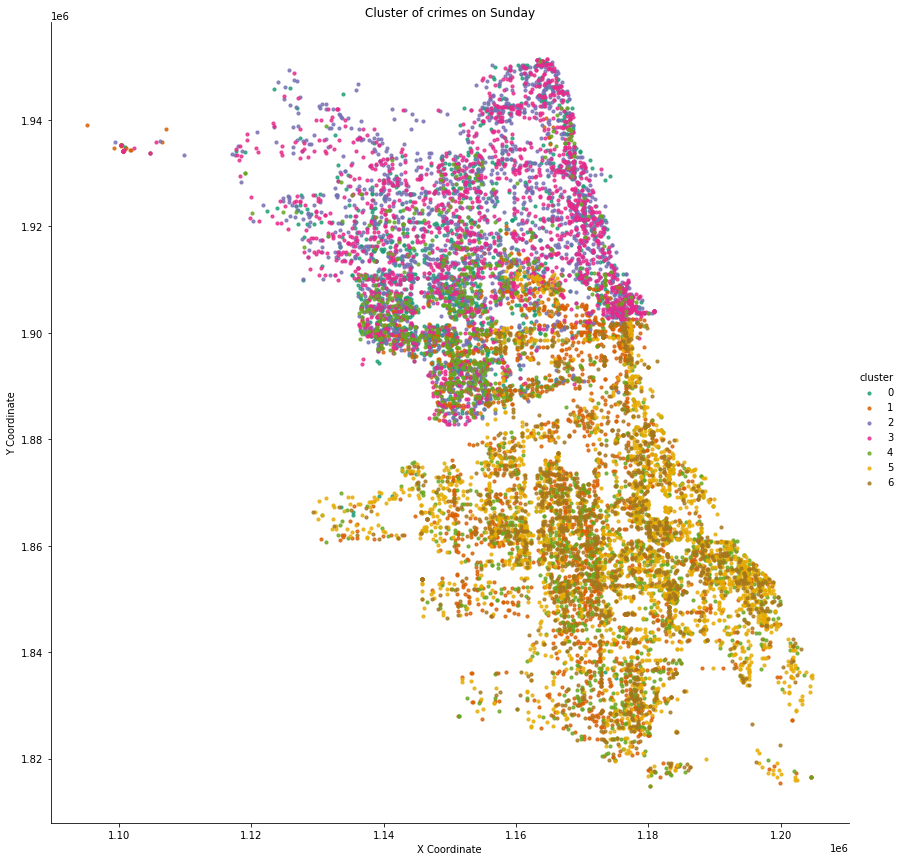

In [246]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(kmeans_clusters7_label_pca, columns = ['cluster'])], axis = 1)
new_crimes_data = new_crimes_data.loc[new_crimes_data['Dayofweek'] == 'Sun']
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Cluster of crimes on Sunday")
plt.show()

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


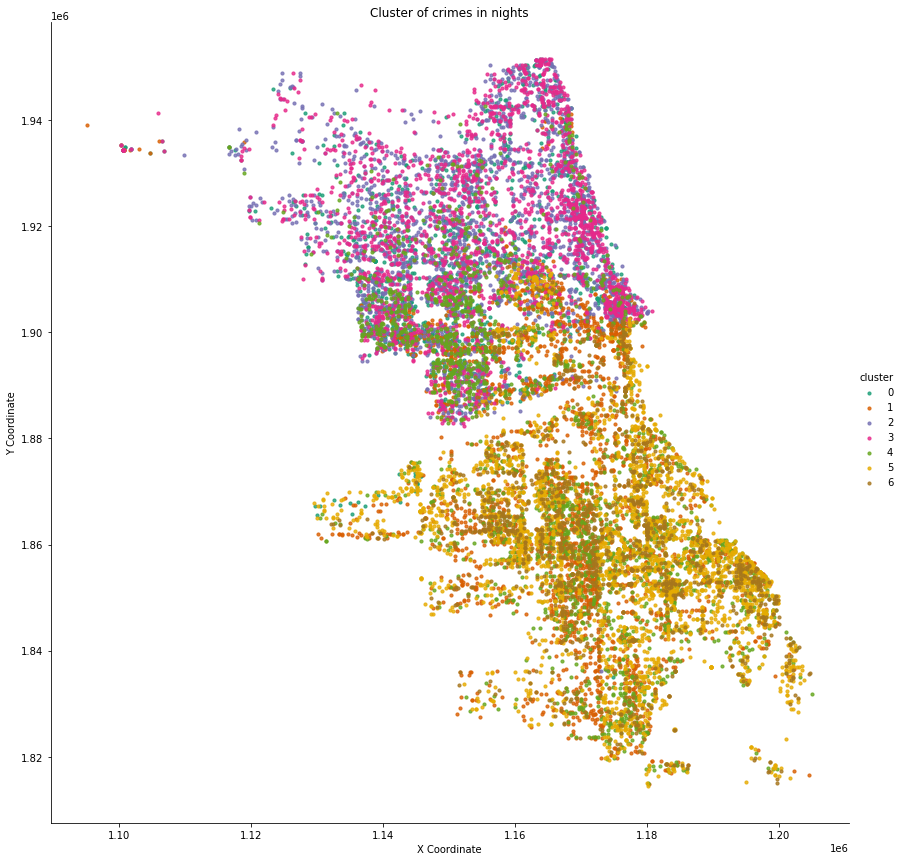

In [247]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(kmeans_clusters7_label_pca, columns = ['cluster'])], axis = 1)
new_crimes_data = new_crimes_data.loc[new_crimes_data['Session'] == 'Night']
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Cluster of crimes in nights")
plt.show()

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


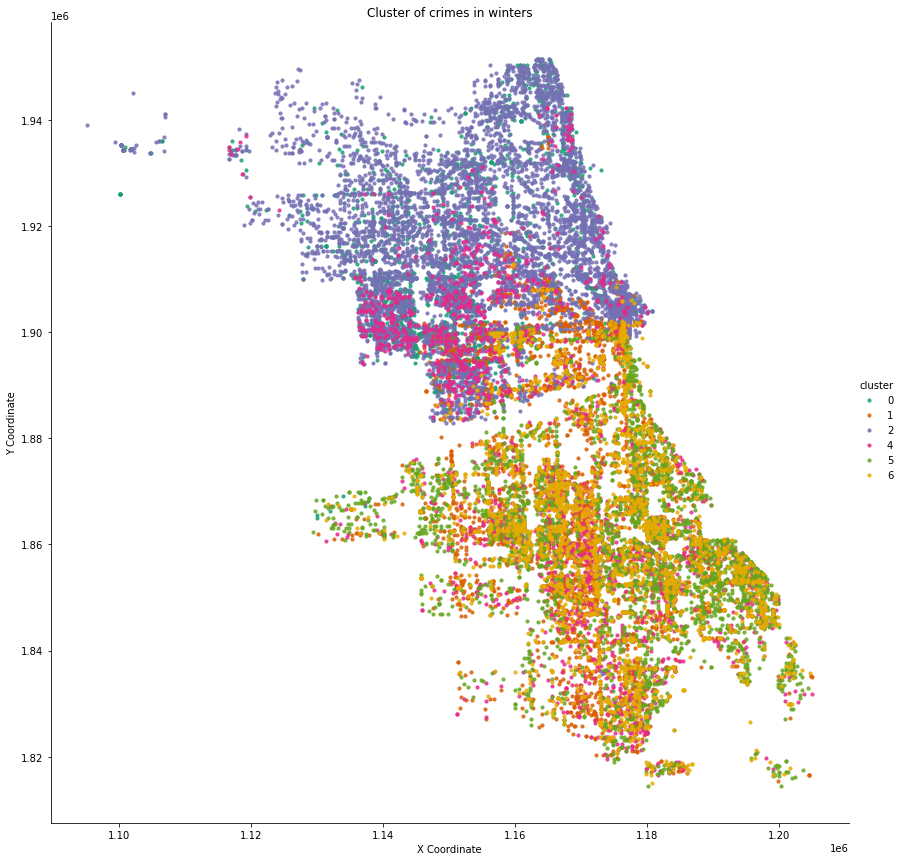

In [248]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(kmeans_clusters7_label_pca, columns = ['cluster'])], axis = 1)
new_crimes_data = new_crimes_data.loc[new_crimes_data['Season'] == 'winter']
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Cluster of crimes in winters")
plt.show()

In [197]:
kmeans8 = KMeans(8)
kmeans8.fit(df_label_reduced)
kmeans_clusters8_label_pca = kmeans8.fit_predict(df_label_reduced)
kmeans_clusters8_label_pca

array([4, 6, 7, ..., 3, 7, 4])

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


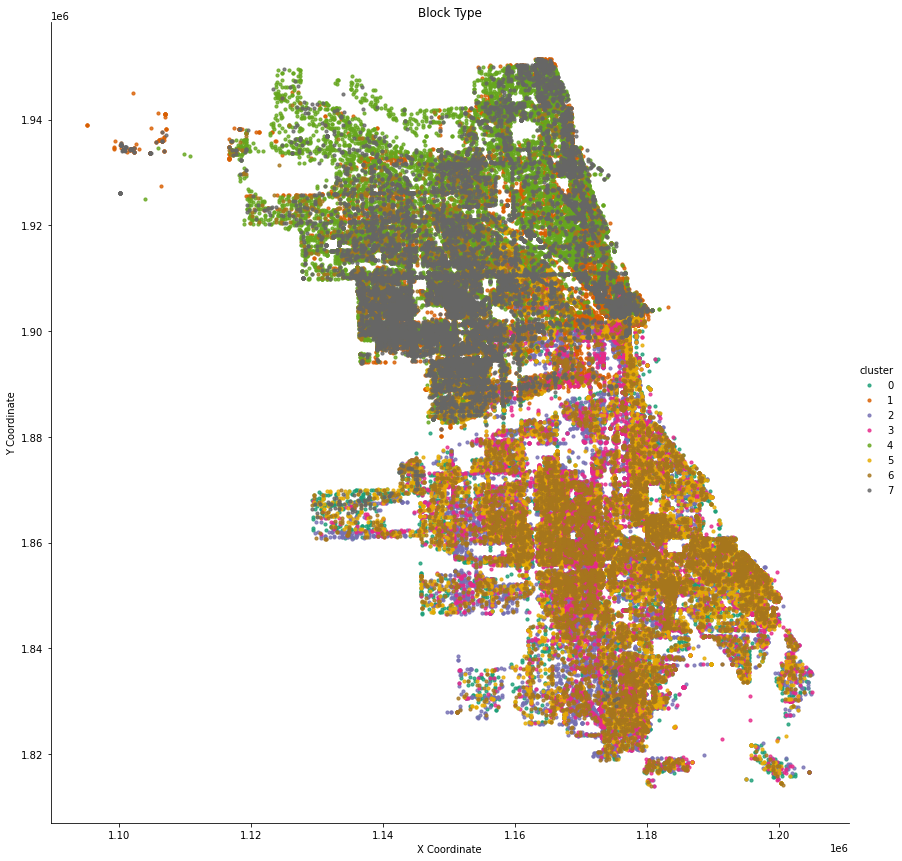

In [225]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(kmeans_clusters8_label_pca, columns = ['cluster'])], axis = 1)
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Block Type")
plt.show()

In [198]:
from sklearn import metrics
metrics.normalized_mutual_info_score(df_targets['Primary Type'], kmeans_clusters8_label_pca)

0.14017036435918157

In [201]:
kmeans9 = KMeans(9)
kmeans9.fit(df_label_reduced)
kmeans_clusters9_label_pca = kmeans9.fit_predict(df_label_reduced)
kmeans_clusters9_label_pca

array([6, 5, 3, ..., 8, 8, 6])

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


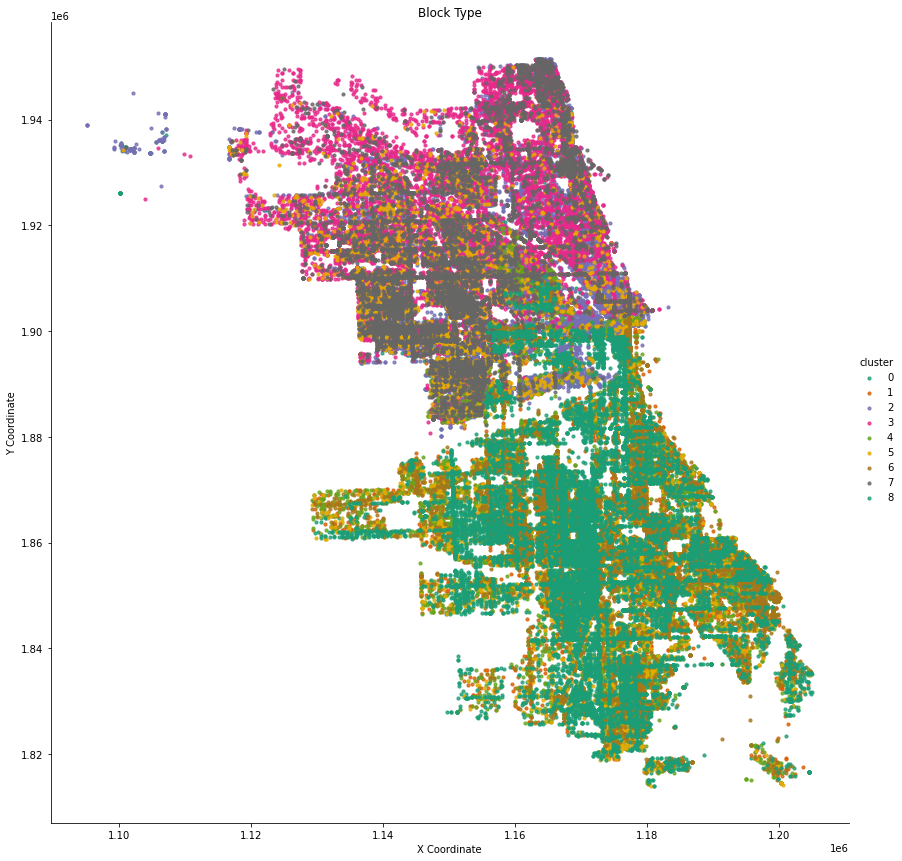

In [226]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(kmeans_clusters9_df_label, columns = ['cluster'])], axis = 1)
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Block Type")
plt.show()

In [202]:
from sklearn import metrics
metrics.normalized_mutual_info_score(df_targets['Primary Type'], kmeans_clusters9_label_pca)

0.13128432061666814

## 5.2 Hierarchical Clustering

In [136]:
df_2016_2018 = df_label.loc[df1['Year'].isin([2016,2017,2018])]
df_2016_2018

,Location Description,Arrest,Domestic,District,Ward,Community Area,X Coordinate,Y Coordinate,Year,Season,Day,Dayofweek,Session,Block Type
2,131,1,0,10,23,24,6478,27879,15,0,15,6,1,0
5,125,1,0,4,5,48,31051,4900,15,0,23,1,0,0
7,108,0,1,3,7,44,35424,7412,15,3,30,2,1,9
20,131,0,0,16,41,7,29077,33422,16,3,23,0,3,9
28,73,1,0,13,28,24,3789,29858,16,2,17,0,2,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99969,69,0,0,19,20,72,22298,6252,17,1,12,5,0,0
99970,131,0,0,2,19,41,33329,15419,17,2,11,5,0,0
99988,143,0,0,3,6,42,36637,11386,15,0,12,5,0,9
99990,127,0,0,0,1,34,30280,24782,17,3,1,5,3,9


In [141]:
df_targets_2016_2018 = df_targets.loc[df['Year'].isin([2016,2017,2018])]

In [135]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
import scipy.cluster.hierarchy as shc
import matplotlib.pyplot as plt
from tqdm import tqdm

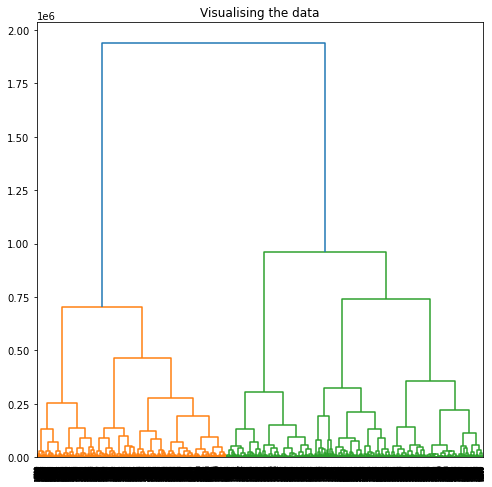

In [137]:
plt.figure(figsize =(8, 8))
plt.title('Visualising the data')
Dendrogram = shc.dendrogram((shc.linkage(df_2016_2018, method='ward')))

In [212]:
agc_2016_2018_2 = AgglomerativeClustering(n_clusters=2, linkage='ward').fit(df_2016_2018)

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


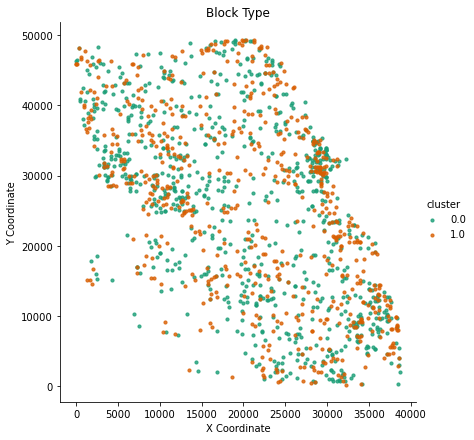

In [229]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df_2016_2018, pd.DataFrame(agc_2016_2018_2.labels_, columns = ['cluster'])], axis = 1)

sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=6,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Block Type")
plt.show()

In [213]:
from sklearn import metrics
metrics.normalized_mutual_info_score(df_targets_2016_2018['primary_type_grouped'], agc_2016_2018_2.labels_)

0.004078200972672186

In [210]:
agc_2016_2018_6 = AgglomerativeClustering(n_clusters=6, linkage='ward').fit(df_2016_2018)

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


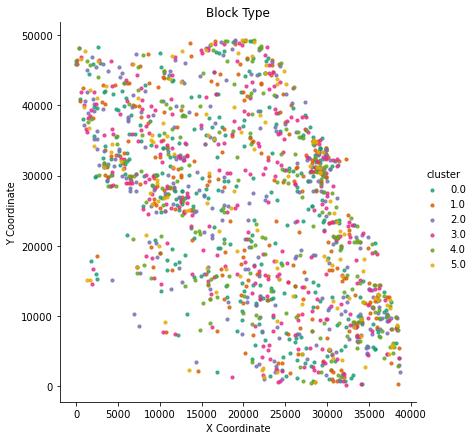

In [231]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df_2016_2018, pd.DataFrame(agc_2016_2018_6.labels_, columns = ['cluster'])], axis = 1)
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=6,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Block Type")
plt.show()

In [211]:
from sklearn import metrics
metrics.normalized_mutual_info_score(df_targets_2016_2018['primary_type_grouped'], agc_2016_2018_6.labels_)

0.019902870992331047

In [214]:
agc_2016_2018_8 = AgglomerativeClustering(n_clusters=8, linkage='ward').fit(df_2016_2018)

In [215]:
agc_2016_2018_8.labels_

array([1, 0, 0, ..., 0, 6, 1], dtype=int64)

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


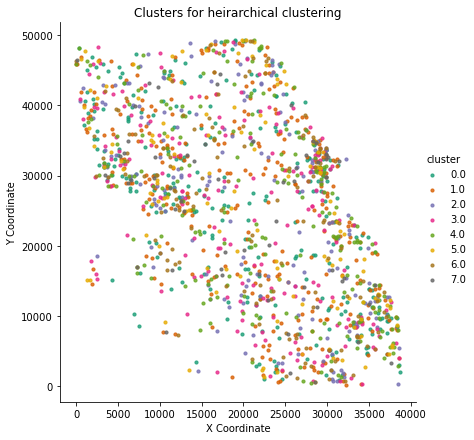

In [249]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df_2016_2018, pd.DataFrame(agc_2016_2018_8.labels_, columns = ['cluster'])], axis = 1)
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=6,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Clusters for heirarchical clustering")
plt.show()

In [216]:
from sklearn import metrics
metrics.normalized_mutual_info_score(df_targets_2016_2018['primary_type_grouped'], agc_2016_2018_8.labels_)

0.021811557488581133

In [218]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
df_label_2016_2018_rescaled = scaler.fit_transform(df_2016_2018)

In [219]:
agc_2016_2018_rescaled = AgglomerativeClustering(n_clusters=8, linkage='ward').fit(df_label_2016_2018_rescaled)

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


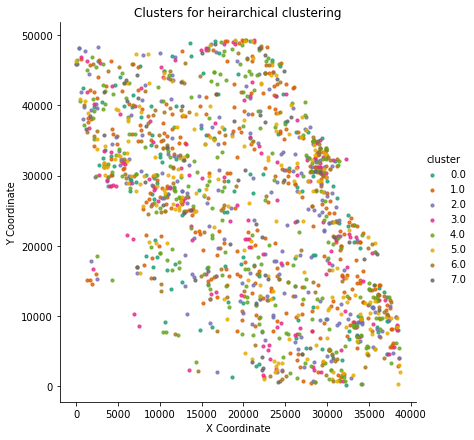

In [250]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df_2016_2018, pd.DataFrame(agc_2016_2018_rescaled.labels_, columns = ['cluster'])], axis = 1)
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=6,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Clusters for heirarchical clustering")
plt.show()

In [220]:
from sklearn import metrics
metrics.normalized_mutual_info_score(df_targets_2016_2018['primary_type_grouped'], agc_2016_2018_rescaled.labels_)

0.12700198026908074

## KMode Clustering

In [ ]:
from kmodes.kmodes import KModes
import matplotlib.pyplot as plt
df_targets['Primary Type'].unique().shape

from tqdm import tqdm

cost = []
K = range(1,32)
for num_clusters in tqdm(list(K)):
    kmode = KModes(n_clusters=num_clusters, init = "random", n_init = 5, verbose=1)
    kmode.fit_predict(df)
    cost.append(kmode.cost_)
   
plt.plot(K, cost, 'bx-')
plt.xlabel('No. of clusters')
plt.ylabel('Cost')
plt.title('Elbow Method For Optimal k')
plt.show()

kmode = KModes(n_clusters=8, init = "random", n_init = 20, verbose=1)
clusters = kmode.fit_predict(df)
clusters
np.save('clusters_kmodes_8.npy', clusters)
df['cluster'] = clusters

kmode = KModes(n_clusters=21, init = "random", n_init = 20, verbose=1)
clusters = kmode.fit_predict(df)
np.save('clusters_kmodes_21.npy', clusters)

kmode = KModes(n_clusters=28, init = "random", n_init = 20, verbose=1)
clusters = kmode.fit_predict(df)
np.save('clusters_kmodes_28.npy', clusters)

In [206]:
clusters_kmodes_8 = np.load('clusters_kmodes_8.npy')
metrics.normalized_mutual_info_score(df_targets['Primary Type'], clusters_kmodes_8)

0.020616795663382557

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


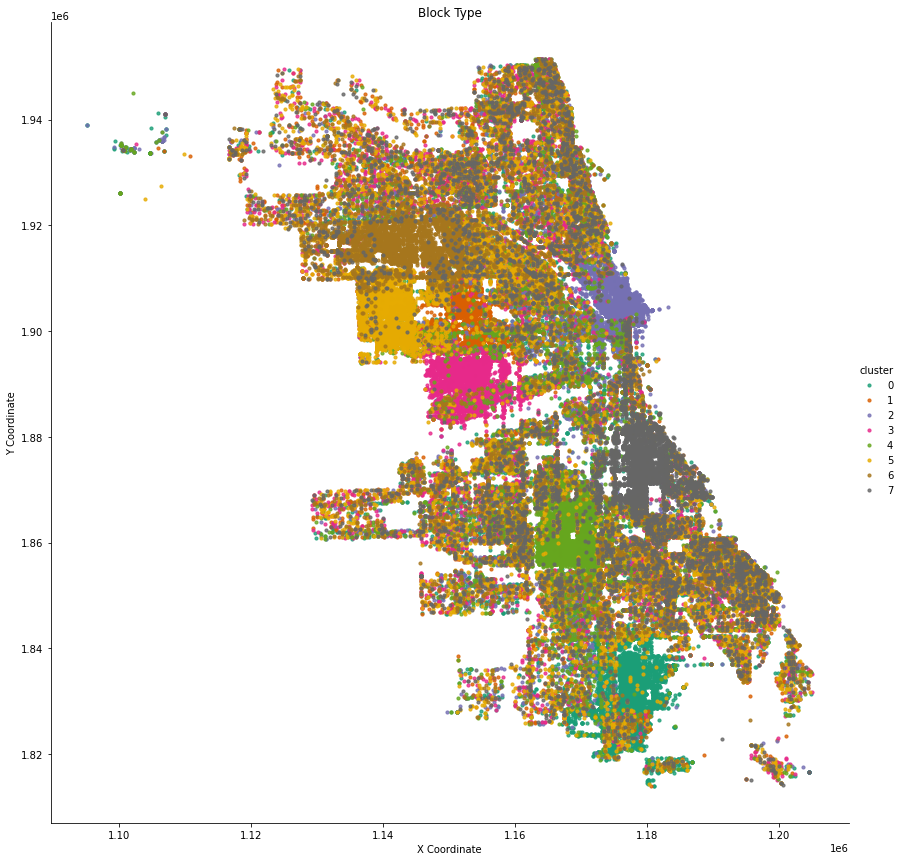

In [236]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(clusters_kmodes_8, columns = ['cluster'])], axis = 1)
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Block Type")
plt.show()

In [207]:
clusters_kmodes_21 = np.load('clusters_kmodes_21.npy')
metrics.normalized_mutual_info_score(df_targets['Primary Type'], clusters_kmodes_21)

0.023584574650869397

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


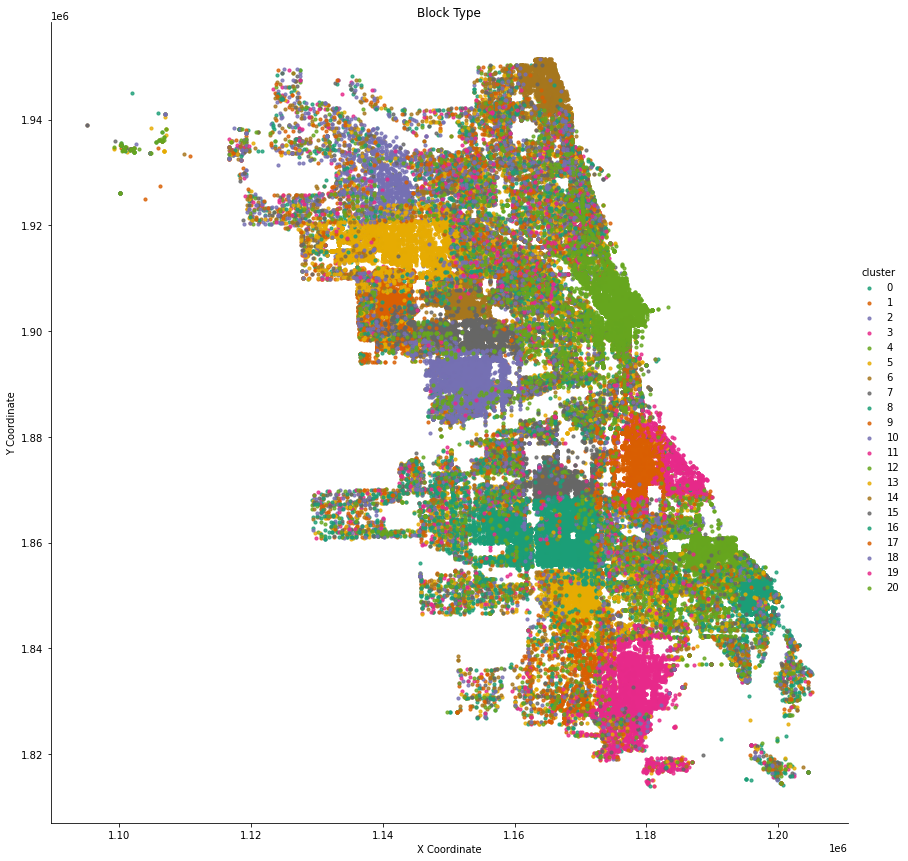

In [237]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(clusters_kmodes_21, columns = ['cluster'])], axis = 1)
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Block Type")
plt.show()

In [208]:
clusters_kmodes_28 = np.load('clusters_kmodes_28.npy')
metrics.normalized_mutual_info_score(df_targets['Primary Type'], clusters_kmodes_28)

0.03788099919673029

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


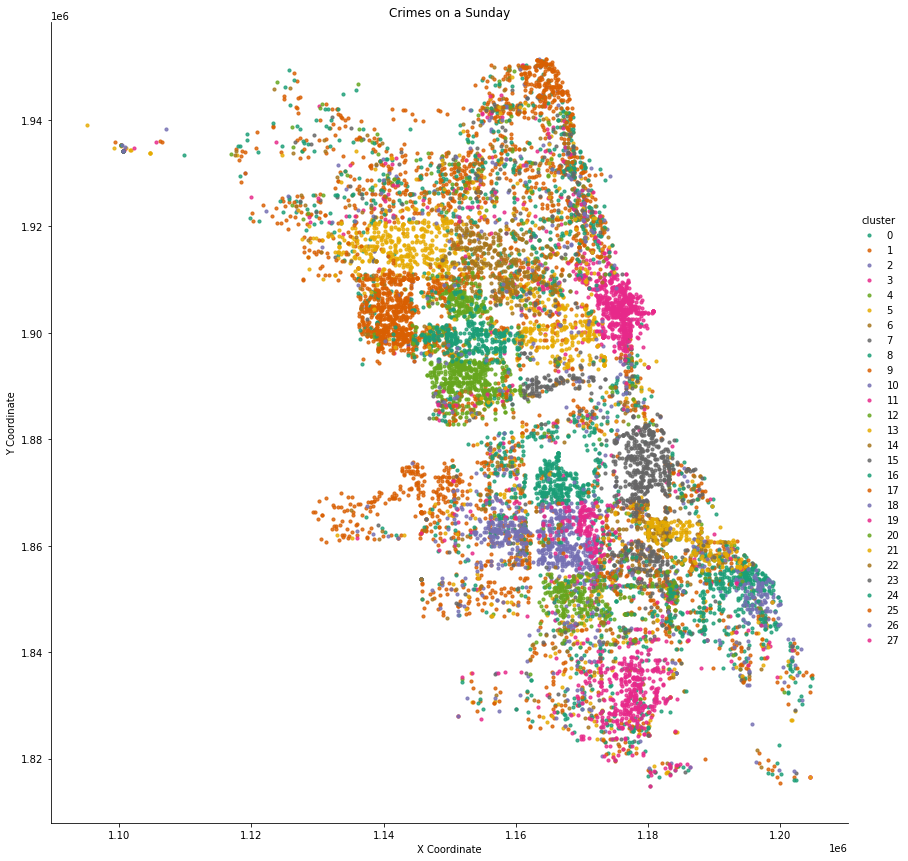

In [252]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(clusters_kmodes_28, columns = ['cluster'])], axis = 1)
new_crimes_data = new_crimes_data.loc[new_crimes_data['Dayofweek'] == 'Sun']
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Crimes on a Sunday")
plt.show()

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


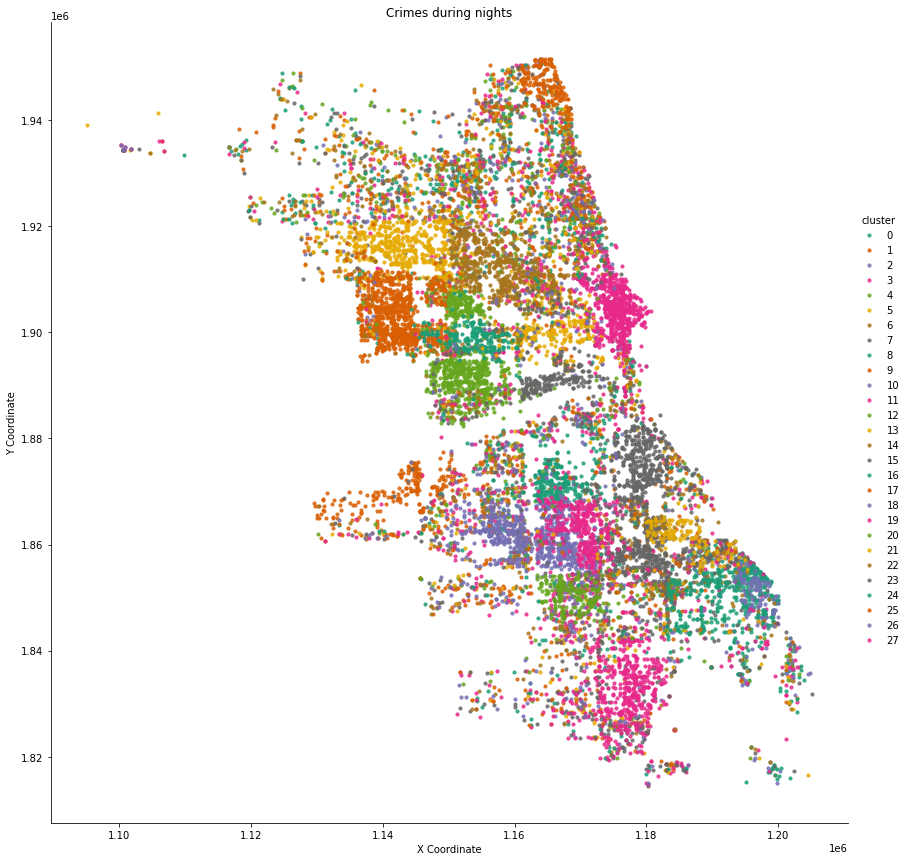

In [254]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(clusters_kmodes_28, columns = ['cluster'])], axis = 1)
new_crimes_data = new_crimes_data.loc[new_crimes_data['Session'] == 'Night']
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Crimes during nights")
plt.show()

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


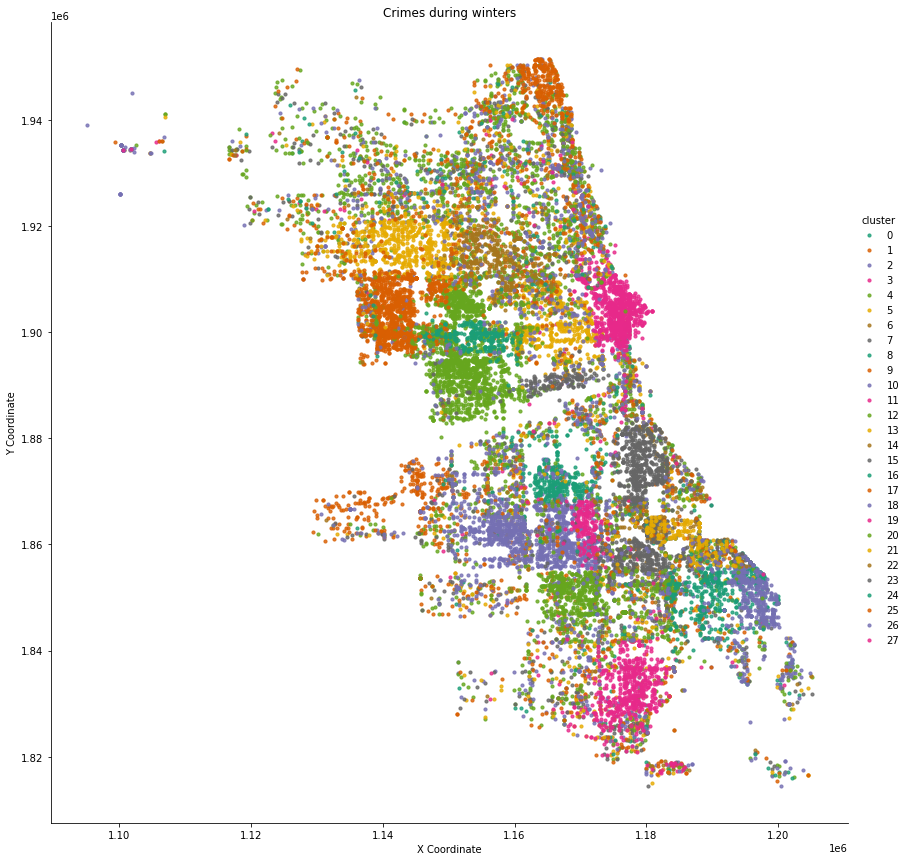

In [255]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(clusters_kmodes_28, columns = ['cluster'])], axis = 1)
new_crimes_data = new_crimes_data.loc[new_crimes_data['Season'] == 'winter']
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Crimes during winters")
plt.show()

### visualization

In [ ]:
# !pip3 install seaborn

In [69]:
df_iucr = df_targets['IUCR'].astype('category').cat.codes

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(df_targets['Primary Type'].astype('category').cat.codes.to_numpy(), columns = ['primary_type'])], axis = 1)
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Crimes by District")

TypeError: cannot concatenate object of type '<class 'numpy.ndarray'>'; only Series and DataFrame objs are valid

In [85]:
### kmeans cluster

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Crimes by District')

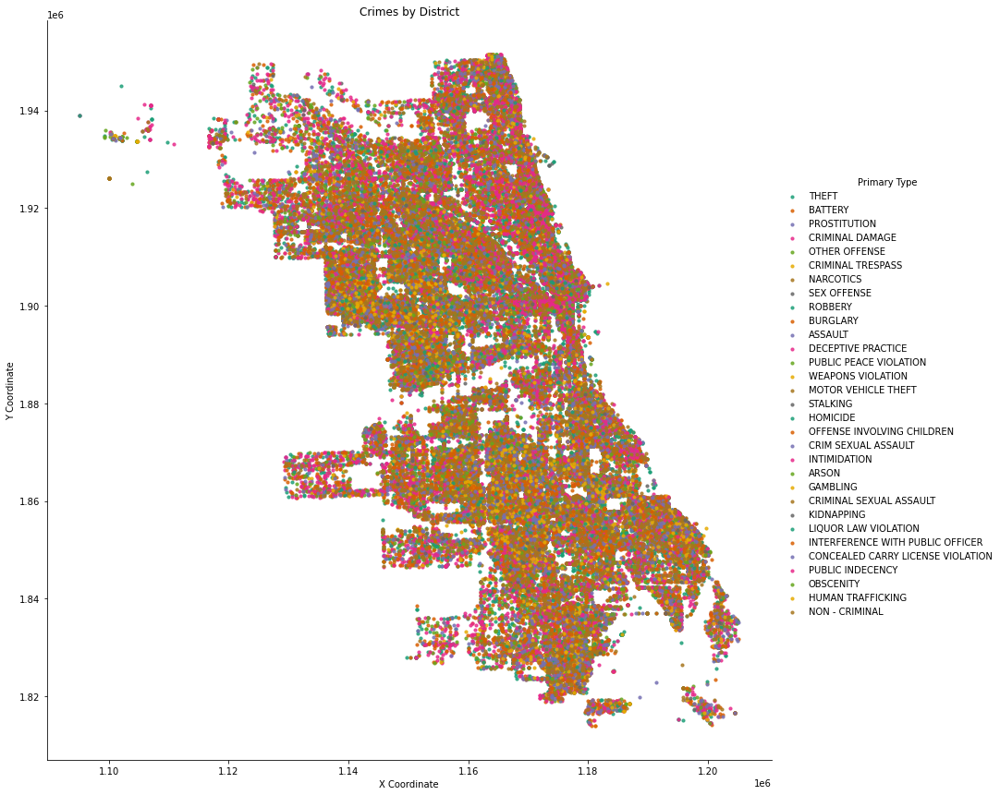

In [85]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(df_targets['Primary Type'])], axis = 1)
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="Primary Type",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Crimes by District")

In [87]:
### kmodes cluster

In [88]:
clusters_kmodes = np.load('clusters_kmodes.npy')

/Users/anudeepragata/miniforge3/envs/tensorflow/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


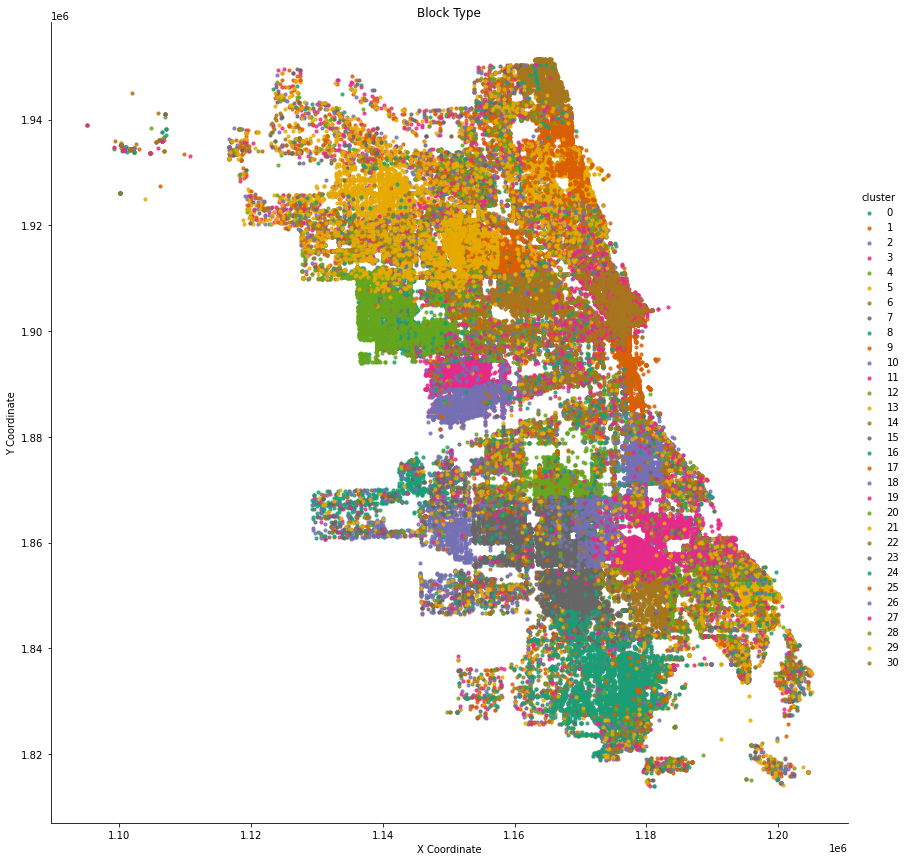

In [90]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(clusters_kmodes, columns = ['cluster'])], axis = 1)
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Block Type")
plt.show()

In [106]:
from sklearn.metrics import normalized_mutual_info_score
normalized_mutual_info_score(df_targets['primary_type_grouped'], identified_clusters)

0.002591711282653446

C:\Users\anshd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


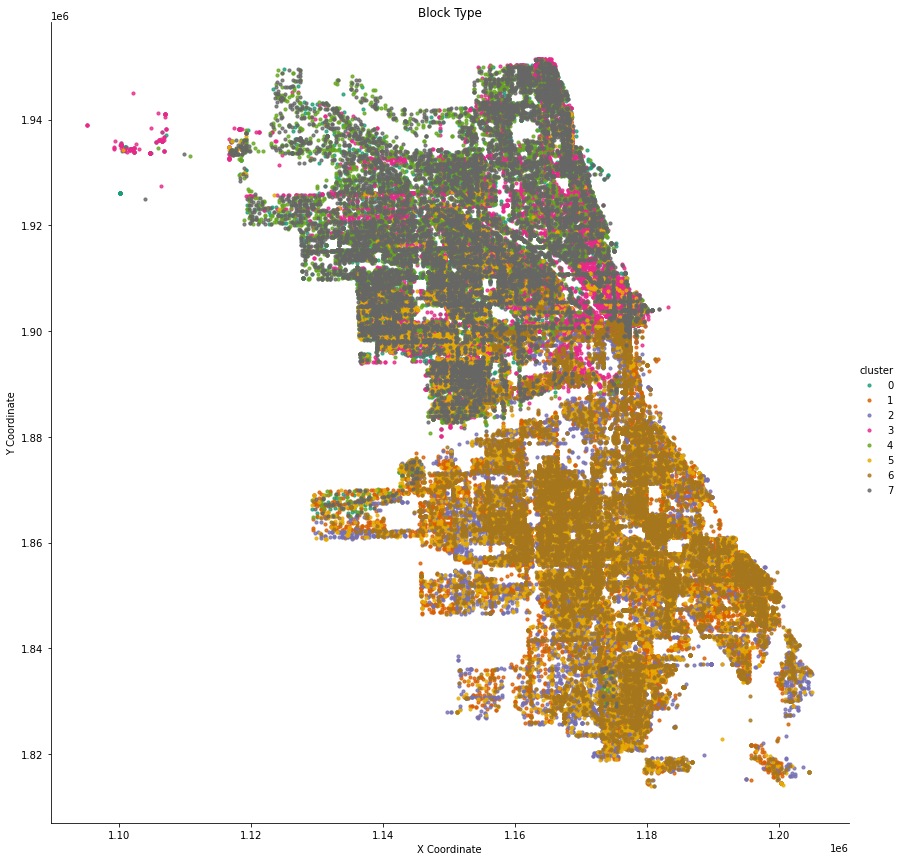

In [150]:
import seaborn as sns
import matplotlib.pyplot as plt
new_crimes_data = pd.concat([df, pd.DataFrame(kmeans_clusters6, columns = ['cluster'])], axis = 1)
sns.lmplot('X Coordinate', 
           'Y Coordinate',
           data=new_crimes_data[:],
           fit_reg=False, 
           hue="cluster",
           palette='Dark2',
           height=12,
           ci=2,
           scatter_kws={"marker": "D", 
                        "s": 10})
ax = plt.gca()
ax.set_title("Block Type")
plt.show()